# **Анализ рынка заведений общественного питания Москвы**

## **1. Цели исследования и план работ**

**Задачи исследования**

Инвесторы изучают возможность открыть заведение общественного питания в Москве. В рамках изучения ситуации в этом сегменте требуется подготовить исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Для анализа доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

Приоритетной идеей для инвесторов является открытие привлекательной и  доступной кофейни в Москве. Поэтому на втором этапе исследования требуется проанализировать более глубоко рынок кофеен в Москве и дать рекомендации по вопросу вариантов месторасположения потенциальной кофейни и ее ценовой категории.

**Описание данных**

Датасет содержит следующую информацию:

+ name — название заведения;
+ address — адрес заведения;
+ category — категория заведения (кафе, пиццерия, кофейня и т.д.);
+ hours — информация о днях и часах работы;
+ lat — широта географической точки, в которой находится заведение;
+ lng — долгота географической точки, в которой находится заведение;
+ rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
+ price — категория цен в заведении («средние», «ниже среднего», «выше среднего» и т.д.);
+ avg_bill — средня стоимость заказа;
+ middle_avg_bill — средняя сумма чека:
+ middle_coffee_cup — средняя стоимость одной чашки капучино:
+ chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
+ district — административный район;
+ seats — количество посадочных мест.

**План работ**

+ Проанализировать, какие категории заведений общественного питания присутствуют на сегодняшний день в Москве, как заведения распределяются по типам и округам, изучить размер и рейтинги заведений, выделить наиболее популярные сетевые точки, исследовать, где располагается больше всего заведений, а где - меньше всего;

+ Построить визуализации для демонстрации результатов анализа и подготовки презентации;

+ На втором этапе - проанализировать рынок кофеен в Москве: как они распределены по округам, часы их работы, средние рейтинги, ценовые категории и число посадочных мест; 

+ Предоставить инвесторам предложения по поводу открытия новой кофейни, исходя из результатов проведенного анализа, определить наиболее перспективные для этого районы и дать рекомендации по вопросу ценообразования.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go

In [2]:
import json
import folium
from folium import Marker
from folium import Map, Choropleth
from folium.plugins import MarkerCluster

In [3]:
sns.set()

In [4]:
! gdown 1-M-5gVfT1La9BU_KeJP-WHmTq5g0bEsg

Downloading...
From: https://drive.google.com/uc?id=1-M-5gVfT1La9BU_KeJP-WHmTq5g0bEsg
To: /content/moscow_places.csv
100% 2.20M/2.20M [00:00<00:00, 90.4MB/s]


In [38]:
! gdown 1q7juFA6dyFfc5szlATYRCZWbPoa7Eb_4

Downloading...
From: https://drive.google.com/uc?id=1q7juFA6dyFfc5szlATYRCZWbPoa7Eb_4
To: /content/admin_level_geomap.geojson
100% 382k/382k [00:00<00:00, 72.0MB/s]


In [5]:
df = pd.read_csv('/content/moscow_places.csv')

## **2. Исследовательский анализ данных**

In [6]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [7]:
def df_eda(df):
  class color:
    BLUE = '\033[94m'
    BOLD = '\033[1m'
    END = '\033[0m'
  
  def tbl_dict_base(df, col):
    tbl_dict = {}
    tbl_dict['valid'] = (~df[col].isnull()).sum()
    tbl_dict['valid_pct'] = tbl_dict['valid']/len(df)
    tbl_dict['missing'] = (df[col].isnull()).sum()
    tbl_dict['missing_pct'] = tbl_dict['missing']/len(df)
    tbl_dict['unique_values'] = df[col].nunique()
    return tbl_dict

  def display_table(tbl_dict, subset1=['missing', 'missing_pct'], \
                    subset2=['valid_pct', 'missing_pct']):
    tbl_det = pd.DataFrame([tbl_dict])
    tbl_det = (
        tbl_det.style.applymap(lambda x: 'color:red' if x > 0 else 'color:green', 
                              subset=subset1)
        .format('{:0.2%}', subset=subset2).hide_index()
      )
    display(tbl_det)

  pd.set_option('display.max_columns', None)
  print(color.BOLD + 'General information' + color.END)
#   display(df.head())
#   print('')
  display(df.info())
  df_duples = df.copy()
  print('')

  print(color.BOLD + 'Heatmap - missing values' + color.END)
  fig, ax = plt.subplots(figsize=(8,5))
  sns.heatmap(df.isna(), cmap='Blues', cbar=False)
  plt.show();
  print('')
  print('')
  print(color.BOLD + 'Column stats' + color.END)
  print('')

  missing_cols_cnt = 0
  missing_cols_list = []
  
  for col in df.columns:
    if df[col].dtype == 'object':
      print(color.BLUE + f'{col} - dtype: {df[col].dtype}' + color.END)
      tbl_dict = tbl_dict_base(df, col)
      try:
        df[col] = df[col].str.replace('ё','е')
        tbl_dict['case_sensitive_dupl'] = (
          df[col].str.lower().duplicated().sum() - df[col].duplicated().sum()
        )
        if tbl_dict['case_sensitive_dupl'] > 0:
          df_duples[col] = df_duples[col].str.lower()
        
        display_table(tbl_dict, ['missing', 'missing_pct', 'case_sensitive_dupl'])
      
      except:
        print('Dtype check needed')
        display_table(tbl_dict)
            
      if tbl_dict['missing'] > 0:
        missing_cols_cnt += 1
        missing_cols_list.append(col)

      if tbl_dict['unique_values'] > 5:
        most_common = df[col].value_counts(normalize=True).reset_index()
        most_common.columns=['Most common', col]
        most_common['Most common'] = (
            most_common['Most common']
            .where(most_common['Most common']
                  .isin(df[col].value_counts(normalize=True).head(5).index), 'other')
        )
        most_common = (
            most_common.groupby('Most common', sort=False)[col]
            .agg('sum').to_frame('')
        )

      else:
        most_common = df[col].value_counts(normalize=True).reset_index()
        most_common.columns=['Most common', '']
        most_common = most_common.set_index('Most common')
      
      display(most_common.style.format('{:0.1%}'))
      print('')

    elif df[col].dtype == 'float' or df[col].dtype == 'int64':
      print(color.BLUE + f'{col} - dtype: {df[col].dtype}' + color.END)
      tbl_dict = tbl_dict_base(df, col)
      tbl_dict['zeros'] = len(df[df[col] == 0])
      tbl_dict['negatives'] = len(df[df[col] < 0])
      display_table(tbl_dict)

      if tbl_dict['missing'] > 0:
        missing_cols_cnt += 1
        missing_cols_list.append(col)
      
      if tbl_dict['unique_values'] < 50:
        sns.histplot(df[col], bins=tbl_dict['unique_values'])
      elif tbl_dict['unique_values'] > 100:
        sns.histplot(df[col], bins=50)
      else:
        sns.histplot(df[col], bins=tbl_dict['unique_values']//2)
      plt.show();
      tbl_stats = pd.DataFrame({'':[df[col].mean(), df[col].median(), 
                                   df[col].std(), df[col].min(),
                                   df[col].max(), df[col].quantile(0.01),
                                   df[col].quantile(0.99)]})
      tbl_stats.index = ['mean', 'median', 'std', 'min', 'max', 
                         '1st quantile', '99th quantile']
      display(tbl_stats.style.format('{:.2f}'))
      # display(df[col].describe().to_frame('')[1:].style.format("{:.2f}"))
      print('')
      if col.lower() == 'id' or col.lower() == 'userid' or col.lower() == 'user_id':
        id_duples = df[col].duplicated().sum()

    elif df[col].dtype == 'datetime64[ns]':
      print(color.BLUE + f'{col} - dtype: {df[col].dtype}' + color.END)
      tbl_dict = tbl_dict_base(df, col)
      display_table(tbl_dict)

      if tbl_dict['missing'] > 0:
        missing_cols_cnt += 1
        missing_cols_list.append(col)

      if tbl_dict['unique_values'] < 50:
        sns.histplot(df[col], bins=tbl_dict['unique_values'])
      elif tbl_dict['unique_values'] > 100:
        sns.histplot(df[col], bins=50)
      else:
        sns.histplot(df[col], bins=tbl_dict['unique_values']//2)
      plt.xticks(rotation=45)
      plt.show();
      display(df[col].apply(['min', 'max', 'mean']).to_frame(''))
      print('')

    elif df[col].dtype == 'bool':
      print(color.BLUE + f'{col} - dtype: {df[col].dtype}' + color.END)
      tbl_dict = tbl_dict_base(df, col)
      display_table(tbl_dict)
      display(df[col].value_counts(normalize=True).to_frame('').style.format('{:0.1%}'))
      
      if tbl_dict['missing'] > 0:
        missing_cols_cnt += 1
        missing_cols_list.append(col)
    
    else:
      print(color.BLUE + col + color.END)
      print('check format')

  id_duples = 0
  if col.lower() == 'id' or col.lower() == 'userid' or col.lower() == 'user_id':
        id_duples = df[col].duplicated().sum()
  
  print(color.BLUE + 'EDA brief' + color.END)
  print('')
  print(f'Rows in dataset: {df.shape[0]}')
  print(f'Columns in dataset: {df.shape[1]}')
  print(f'Number of columns with missing values: {missing_cols_cnt}')
  print('Columns with missing values: ', missing_cols_list)
  print('')

  print(color.BOLD + 'Duplicates in dataset: ' + color.END)
  tbl_dupl = (
      pd.DataFrame({'duples_cnt':[df.duplicated().sum()], 
                    'duples_pct':[df.duplicated().sum()/len(df)],
                    'case_sensitive_duples':[(df_duples.duplicated().sum()-df.duplicated().sum())],
                    'case_sensitive_pct':[(df_duples.duplicated().sum()-df.duplicated().sum())/len(df)], 
                    'id_duples':[id_duples],
                    'id_duples_pct':[id_duples/len(df)]})
      .style.applymap(lambda x: 'color:red' if x > 0 else 'color:green')
      .format('{:.2%}', subset=['duples_pct', 'case_sensitive_pct', 'id_duples_pct'])
  )
  display(tbl_dupl)

General information
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None


Heatmap - missing values


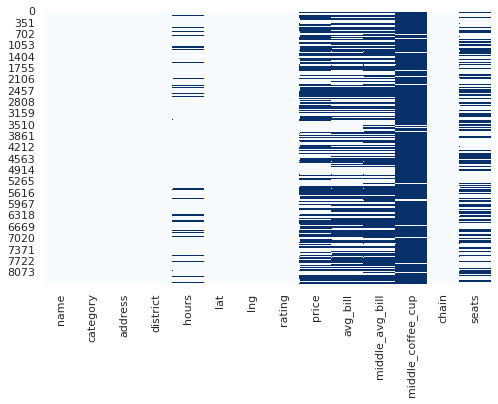



Column stats

name - dtype: object


valid,valid_pct,missing,missing_pct,unique_values,case_sensitive_dupl
8406,100.00%,0,0.00%,5614,102


,
Most common,
Кафе,2.2%
Шоколадница,1.4%
Домино'с Пицца,0.9%
Додо Пицца,0.9%
One Price Coffee,0.8%
other,93.7%



category - dtype: object


valid,valid_pct,missing,missing_pct,unique_values,case_sensitive_dupl
8406,100.00%,0,0.00%,8,0


,
Most common,
кафе,28.3%
ресторан,24.3%
кофейня,16.8%
"бар,паб",9.1%
пиццерия,7.5%
other,14.0%



address - dtype: object


valid,valid_pct,missing,missing_pct,unique_values,case_sensitive_dupl
8406,100.00%,0,0.00%,5753,1


,
Most common,
"Москва, проспект Вернадского, 86В",0.3%
"Москва, Усачева улица, 26",0.3%
"Москва, площадь Киевского Вокзала, 2",0.2%
"Москва, Ярцевская улица, 19",0.2%
"Москва, Каширское шоссе, 61Г",0.2%
other,98.7%



district - dtype: object


valid,valid_pct,missing,missing_pct,unique_values,case_sensitive_dupl
8406,100.00%,0,0.00%,9,0


,
Most common,
Центральный административный округ,26.7%
Северный административный округ,10.7%
Южный административный округ,10.6%
Северо-Восточный административный округ,10.6%
Западный административный округ,10.1%
other,31.3%



hours - dtype: object


valid,valid_pct,missing,missing_pct,unique_values,case_sensitive_dupl
7870,93.62%,536,6.38%,1307,0


,
Most common,
"ежедневно, 10:00–22:00",9.6%
"ежедневно, круглосуточно",9.3%
"ежедневно, 11:00–23:00",5.0%
"ежедневно, 10:00–23:00",3.9%
"ежедневно, 12:00–00:00",3.2%
other,68.9%



lat - dtype: float64


valid,valid_pct,missing,missing_pct,unique_values,zeros,negatives
8406,100.00%,0,0.00%,8209,0,0


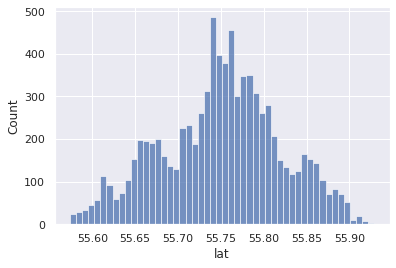

,
mean,55.75
median,55.75
std,0.07
min,55.57
max,55.93
1st quantile,55.59
99th quantile,55.90



lng - dtype: float64


valid,valid_pct,missing,missing_pct,unique_values,zeros,negatives
8406,100.00%,0,0.00%,8258,0,0


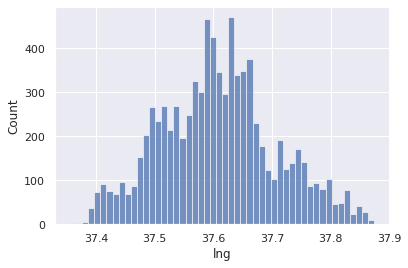

,
mean,37.61
median,37.61
std,0.10
min,37.36
max,37.87
1st quantile,37.40
99th quantile,37.84



rating - dtype: float64


valid,valid_pct,missing,missing_pct,unique_values,zeros,negatives
8406,100.00%,0,0.00%,41,0,0


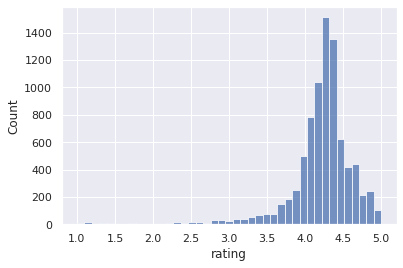

,
mean,4.23
median,4.30
std,0.47
min,1.00
max,5.00
1st quantile,2.30
99th quantile,5.00



price - dtype: object


valid,valid_pct,missing,missing_pct,unique_values,case_sensitive_dupl
3315,39.44%,5091,60.56%,4,0


,
Most common,
средние,63.9%
выше среднего,17.0%
высокие,14.4%
низкие,4.7%



avg_bill - dtype: object


valid,valid_pct,missing,missing_pct,unique_values,case_sensitive_dupl
3816,45.40%,4590,54.60%,897,0


,
Most common,
Средний счет:1000–1500 ₽,6.3%
Средний счет:1500–2000 ₽,3.1%
Средний счет:300–500 ₽,2.4%
Средний счет:500–1000 ₽,2.0%
Средний счет:1500–2500 ₽,1.8%
other,84.4%



middle_avg_bill - dtype: float64


valid,valid_pct,missing,missing_pct,unique_values,zeros,negatives
3149,37.46%,5257,62.54%,230,1,0


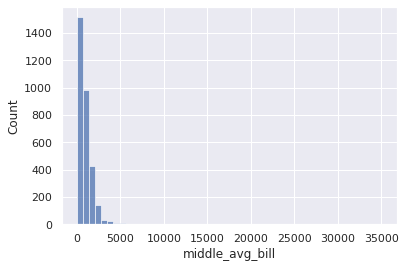

,
mean,958.05
median,750.00
std,1009.73
min,0.00
max,35000.00
1st quantile,140.00
99th quantile,3750.00



middle_coffee_cup - dtype: float64


valid,valid_pct,missing,missing_pct,unique_values,zeros,negatives
535,6.36%,7871,93.64%,96,0,0


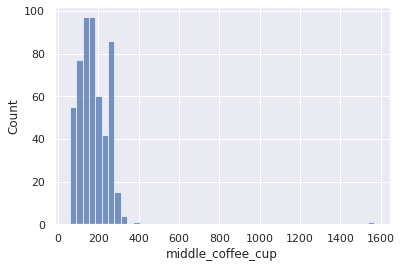

,
mean,174.72
median,169.00
std,88.95
min,60.00
max,1568.00
1st quantile,60.00
99th quantile,309.90



chain - dtype: int64


valid,valid_pct,missing,missing_pct,unique_values,zeros,negatives
8406,100.00%,0,0.00%,2,5201,0


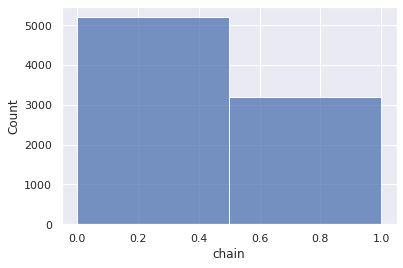

,
mean,0.38
median,0.00
std,0.49
min,0.00
max,1.00
1st quantile,0.00
99th quantile,1.00



seats - dtype: float64


valid,valid_pct,missing,missing_pct,unique_values,zeros,negatives
4795,57.04%,3611,42.96%,229,136,0


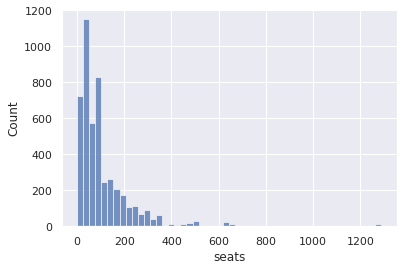

,
mean,108.42
median,75.00
std,122.83
min,0.00
max,1288.00
1st quantile,0.00
99th quantile,625.00



EDA brief

Rows in dataset: 8406
Columns in dataset: 14
Number of columns with missing values: 6
Columns with missing values:  ['hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats']

Duplicates in dataset: 


,duples_cnt,duples_pct,case_sensitive_duples,case_sensitive_pct,id_duples,id_duples_pct
0,0,0.00%,0,0.00%,0,0.00%


In [8]:
df_eda(df)

В датасете 8406 строки и 14 столбцов. Дубликаты отсутствуют. 

В шести столбцах присутствуют пропущенные значения. Это столбцы hours, price, avg_bill, middle_avg_bill, middle_coffee_cup и seats. На этом этапе необходимо определить целесообразность их замены. Столбцы с названием заведения, категорией, адресом, районом имеют соответствующий текстовой информации тип данных object. Столбцы "Часы работы" и "Средний чек" содержат как текст, так и числа, поэтому здесь также оставляем тип данных object. "Цена" содержит текстовые категории, так что здесь также нужен тип данных object. Сетевой столбец (chain) имеет тип данных int и содержит целые числа 0 и 1.  Остальные столбцы имеют тип данных float и содержат вещественные числовые данные. 

Предварительная проверка на дубликаты показала их отсутствие, однако в датасете есть неявные дубликаты из-за разного написания названий заведений и адресов (строчные/прописные буквы, возможное использование ё/е), что также необходимо устранить.

In [9]:
def drop_duples(df):
  for col in df.columns:
    if df[col].dtype == 'object':
      df[col] = df[col].str.replace('ё','е')
      if (df[col].str.lower().duplicated().sum() - df[col].duplicated().sum()) > 0:
        df[col] = df[col].str.lower()
  df = df.drop_duplicates()
  return df

In [10]:
df = drop_duples(df)

Создадим из столбца с адресом столбец street с названиями улиц. А также проверим, содержатся ли в датасете данные только по Москве.

In [11]:
df['street'] = df['address'].str.split(',').str[1]

In [12]:
# Проверяем, какие уникальные названия городов содержатся в столбце address
df['address'].str.split(',').str[0].unique()

array(['москва'], dtype=object)

В датасете представлены 9 административных районов Москвы. Больше всего заведений в Центральном административном округе (26.7%), на втором месте с большим отрывом - САО (10,7%). Пропусков в этом столбце нет, как и лишних значений.
Для более компактного отображения названий районов на графиках создадим столбец district_abbr с сокращенными названиями районов в общепринятом формате.

In [13]:
df['district_abbr'] = df['district']

replace_values = {'Северный административный округ' : 'САО', 
                  'Северо-Восточный административный округ' : 'СВАО', 
                  'Северо-Западный административный округ' : 'СЗАО', 
                  'Западный административный округ': 'ЗАО', 
                  'Центральный административный округ': 'ЦАО', 
                  'Восточный административный округ': 'ВАО',
                  'Юго-Восточный административный округ': 'ЮВАО',
                  'Южный административный округ': 'ЮАО',
                  'Юго-Западный административный округ': 'ЮЗАО'
                  }     

df = df.replace({'district_abbr': replace_values}) 

В столбце category всего восемь категорий. Больше всего записей приходится на кафе, рестораны и кофейни (28.3%, 24.3% и 16.8% соответственно). 

В столбце rating оценки варьируются в заданных пределах от 1.0 до 5.0. Средняя оценка 4.2 балла, медианная - чуть выше (4,3 балла). Аномальные значения, требующие замены, отсутствуют. Распределение оценок смещено вправо. В основном, посетители ставят заведениям оценки не ниже 3,0. Более низкие баллы встречаются крайне редко. Основная часть оценок находится в пределах от 4,0 до 4,5 баллов. 

В столбце price информация о ценовой категории заведений представлена очень неполно (пропусков 60,5%). Заменить их не представляется возможным ввиду отсутствия у нас соответствующих данных, поэтому оставляем пропуски, как есть. Две три заведений, по которым доступна информация, попадают в ценовую категорию "средние". Почти пятая часть заведений (17%) отнесена к категории "выше среднего". Интересно, что в низкой ценовой категории у нас всего 4,7% заведений.

Данные о среднем чеке доступны лишь для трети заведений. В 62% случаев информация отсутствует. Предложить обоснованную замену пропускам мы не можем, поэтому оставляем данные, как есть. Распределение сильно смещено влево. В 99% случаев размер среднего чека не превышает 3750 руб. Значения от 4 до 35 тыс. для среднего чека - единичны.

В заполненных ячейках присутствует одно значение, равное 0 рублей, то есть, фактически, в этом случае отсутствует корректная информация, поэтому заменим нулевое значение на NaN.

In [14]:
df['middle_avg_bill'] = df['middle_avg_bill'].replace(0, np.nan)

В столбце middle_coffee_cup доля пропусков 93,6%, т.е. заполнено у нас всего 6,4% строк, что, в целом, объяснимо, поскольку информация о стоимости капучино - специализированная и больше актуальна для кофеен, нежели для остальных заведений. Поэтому для всех остальных случаев пропуски целесообразно оставить, как есть.

Значения средней стоимости капучино варьируются от 60 руб. до 1568 руб. Максимальная цена чашки кофе, конечно, немного удивляет, однако для элитных сортов кофе такое вполне возможно. Средняя стоимость - 175 руб., медианная чуть ниже - 169 руб. за счет наличия "выбросов". 


Для удобного отображения данных на графиках и в таблицах создадим столбец is_network с текстовыми категориями "сетевые" и "несетевые".

In [15]:
def network(row):
  if row == 1:
    return 'сетевые'
  else:
    return "несетевые"

In [16]:
df['is_network'] = df['chain'].apply(network)

В столбце seats 43% пропусков, т.е. данные по кол-ву посадочных мест доступны только для 57% заведений. Предложить обоснованную замену пропускам мы не можем за отсутствием информации по остальным заведениям, поэтому оставляем пропуски без изменений.

Кол-во посадочных мест варьируется от 0 до 1288. Нулевое число посадочных мест не выглядит аномальным. Судя по всему, это, в основном, булочные, и, по-видимому, небольшие кафе с едой на вынос, где изначально не предусмотрена возможность посадки. Среднее число посадочных мест - 108, медианное - 75, это значит, что у нас присутствует большое число крупных "выбросов" - заведений с большим числом посадочных мест. При этом у подавляющей части заведений (99%) число посадочных мест не превышает 625. 

In [17]:
# Зададим функцию для создания столбца, где будет проставлено True для заведений, работающих ежедневно и круглосуточно
def classify(row):
  if 'ежедневно' in str(row) and 'круглосуточно' in str(row):
    return True
  else:
    return False

df['is_24/7'] = df['hours'].apply(classify)

In [18]:
df['is_24/7'].mean()

0.08684273138234594

Доля заведений, работающих круглосуточно и ежедневно невелика - всего 8,7% от общего числа.

## **3. Анализ рынка заведений общественного питания в Москве**

### **3.1. Какие категории заведений представлены в данных**

In [19]:
# Визуализируем распределение заведений по категориям 
fig = px.pie(values=df.category.value_counts().values, 
             names=df.category.value_counts().index, 
             title='Распределение объектов общественного питания <br>по категориям',
             width=700, height=450, 
             color_discrete_sequence=px.colors.sequential.Aggrnyl,
             labels={'names':'категория', 'values':'кол-во заведений'},
             hole=0.3)
fig.update_traces(
    textposition='inside', textinfo='percent+label', 
    hovertemplate='категория:%{label}<br>%{value} заведений'
    )
fig.update_layout(
    margin=dict(t=50, l=40, r=40, b=40),
    legend=dict(
    yanchor="top",
    y=0.8,
    xanchor="right",
    x=1.2)        
    )
fig.add_annotation(x= 0.5, y = 0.5,
                    text = f'Всего<br>заведений:<br>{df.category.count()}',
                    font = dict(size=14, color='black'),
                    showarrow = False)
fig.show();

Более четверти всех заведений, представленных в датасете, относятся к категории "кафе" (28,3%, всего 2378 заведений). На втором месте идут рестораны (24,3%, всего 2043 заведений). Кофейни занимают третье место с долей в 16,8% (1413 заведений). Остальные категории насчитывают менее 10% от общего числа каждая. Самая маленькая доля у булочных - 3% (256 заведений). 

### **3.2. Кол-во посадочных мест по категориям**

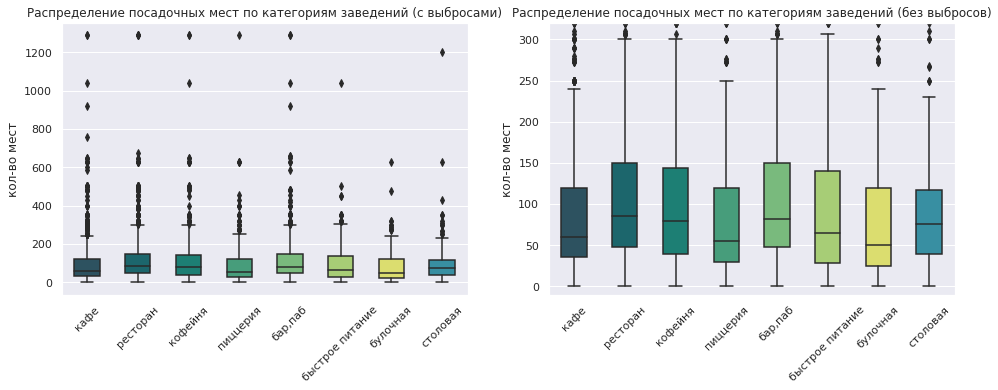

In [20]:
# Визуализируем распределение посадочных мест по отдельным категориям заведений
colors = ['#245668', '#0F7279', '#0D8F81', '#39AB7E', '#6EC574', '#A9DC67', '#EDEF5D', '#269AB4', '#389FB2']

fig, ax = plt.subplots(1,2,figsize=(16,5))
sns.boxplot(data=df, y='seats', x='category', width=0.5, palette=colors, ax=ax[0])
sns.boxplot(data=df, y='seats', x='category', width=0.5, palette=colors, ax=ax[1])
ax[1].set_ylim(-10, 320)
ax[0].set_title('Распределение посадочных мест по категориям заведений (с выбросами)', fontsize=12)
ax[1].set_title('Распределение посадочных мест по категориям заведений (без выбросов)', fontsize=12)
ax[0].set_ylabel('кол-во мест')
ax[1].set_ylabel('кол-во мест')
ax[0].set_xlabel('')
ax[1].set_xlabel('')
xlabels0 = ax[0].get_xticklabels()
ax[0].set_xticklabels(xlabels0, rotation=45)
xlabels1 = ax[1].get_xticklabels()
ax[1].set_xticklabels(xlabels1, rotation=45)
plt.show();

По графику видно, что "выбросы", т.е. заведения с числом посадочных мест, превышающем 600, присутствуют практически по всех категориях, кроме "булочных". У булочных также самое низкое медианное значение этого показателя, что вполне объяснимо, т.к. булочные - это, по большей части, заведения с товаром "на вынос" или для быстрого перекуса. Наибольшие медианные значения кол-ва посадочных мест у баров/пабов, ресторанов и кофеен.

In [21]:
colors2 = ['rgb(133, 92, 117)',
 'rgb(217, 175, 107)',
 'rgb(175, 100, 88)',
 'rgb(115, 111, 76)',
 'rgb(82, 106, 131)',
 'rgb(98, 83, 119)',
 'rgb(104, 133, 92)',
 'rgb(156, 156, 94)',
 'rgb(160, 97, 119)',
 'rgb(140, 120, 93)',
 'rgb(124, 124, 124)',
 'rgb(136, 94, 119)',
 'rgb(219, 179, 113)',
 'rgb(176, 110, 90)',
 'rgb(82, 109, 142)'
 ]

In [22]:
# Подсчитаем среднее число посадочных мест по разным категориям
df_seats_avg = df.groupby('category', as_index=False)['seats'].agg('mean').sort_values(by='seats', ascending=False)

In [23]:
# Визуализируем данные о среднем кол-ве посадочных мест
# colors1 = px.colors.sequential.haline
fig = go.Figure()

fig.add_trace(
    go.Bar(y=df_seats_avg.seats, x=df_seats_avg.category, 
           # orientation='h',
            marker=dict(
            color = colors2, 
            ),           
            text=df_seats_avg.seats,
            textposition='inside',
           width=0.8           
)
)
fig.update_layout(title=dict(text='Среднее число посадочных мест в заведениях разных категорий', 
                             x=0.51,y=0.95, font=dict(size=16)), 
                  width=600, height=400, 
                  yaxis=dict(showticklabels=True),
                  margin=dict(t=50, l=40, r=40, b=40)
                  )

hovertemp = "<b>%{x}:</b><br>"
hovertemp += "<b>%{y:.0f} мест</b><extra></extra>"
fig.update_traces(
    hovertemplate=hovertemp,
    texttemplate='%{y:.0f}'
)
fig.update_yaxes(title_text='число посадочных мест')
fig.show();

По среднему числу посадочных мест тройка лидеров осталась той же - это бары/пабы, рестораны и кофейни (125, 122 и 111 посадочных мест соответственно). Примерно вровень идут столовые, рестораны быстрого питания и кафе (100, 99 и 98 мест). Замыкают рейтинг булочные со средним числом посадочных мест 89.

### **3.3. Соотношение сетевых и несетевых заведений**

In [24]:
net_cat = df.groupby(['is_network', 'category']).agg(cnt=('category', 'count')).reset_index()

In [25]:
fig = px.sunburst(net_cat, path=['is_network', 'category'],
values='cnt', color= 'cnt',
color_continuous_scale=px.colors.sequential.Aggrnyl_r,
labels={'labels':'категория', 'cnt':'число<br>заведений', 'parent':'сеть'},
)

fig.update_layout (
    title=dict(text='Распределение заведений разных категорий<br>по сетевому/несетевому параметру', 
               x=0.1,y=0.93,
               font=dict(size=14)), 
    height = 500 , width = 600, 
    margin=dict(t=70, l=30, r=30, b=40      
                )
)
fig.update_traces(textinfo='percent parent+label', hovertemplate='%{id}: %{value} заведений')

fig.show();

Соотношение сетевых и несетевых заведений в датасете - примерно один к двум (38% сетевых заведений против 62% несетевых). Сетевые заведения - это, как правило, кафе (24%), рестораны (23%) и кофейни (22%). 10% сетевых заведений приходится на пиццерии. 

Топ-3 категорий в несетевых заведениях выглядит точно так же, хотя и с других долевым соотношением: кафе (31%), рестораны (25%), кофейни (13%). На четвертом месте среди несетевых заведений находятся бары и пабы (11%). Доля несетевых пиццерий почти в два раза меньше, чем сетевых (6% против 10%).

Стоит отметить, что доля кофеен в сетевых заведениях также выше, чем в несетевых (22% против 13%), при этом по абсолютным цифрам кофейни составляют примерно равное число как в сетевых, так и в несетевых заведениях (720 против 693).

### **3.4. Какие категории заведений чаще являются сетевыми**

In [26]:
network_grouped = (
    df.groupby(['category', 'is_network'])
    .agg(cnt=('category','count')).reset_index()
    .sort_values(by=['category','is_network'], ascending=False)
)

network_grouped['sum'] = network_grouped.groupby('category')['cnt'].transform('sum')

network_grouped = network_grouped.assign(share=lambda x: x['cnt']/network_grouped.groupby('category')['cnt'].transform('sum')*100)

network = network_grouped.query('is_network == "сетевые"').sort_values(by='share')
non_network = network_grouped.query('is_network == "несетевые"').sort_values(by='share', ascending=False)

In [27]:
# Визуализируем соотношение сетевых и несетевых заведений на графике
fig = go.Figure(data=[
    go.Bar(x=network.share, y=network.category, orientation='h', marker_color='#0F7279', name='сетевые'),
    go.Bar(x=non_network.share, y=non_network.category, orientation='h', marker_color='#6EC574', name='несетевые')]
    )

fig.update_layout(
    barmode='stack',
    title=dict(text='Процентное соотношение сетевых и несетевых заведений в каждой категории', 
                             x=0.51,y=0.95, font=dict(size=16)), 
                  width=800, height=400, 
                  yaxis=dict(showticklabels=True),
                  xaxis_range=[0,100],
                  margin=dict(t=50, l=40, r=40, b=40),
                xaxis={"ticksuffix":"%"}
                  )

hovertemp = "<b>%{y}:</b><br>"
hovertemp += "<b>%{x:.1f}%</b><extra></extra>"
fig.update_traces(
    hovertemplate=hovertemp,
    texttemplate='%{x:.1f}%'
)

fig.show();

Как видно на графике, булочные, пиццерии и кофейни чаще относятся к какой-либо сети, чем другие категории. Здесь процент сетевых заведений превышает 50%. Реже всего сетевые заведения встречаются в категории "бар/паб": здесь сетевые заведения составляют лишь пятую часть).

### **3.5. Топ-15 популярных сетей в Москве**

In [28]:
# Создадим переменную top15 для самых часто встречающихся сетевых заведений в Москве
top15 = (
    df.query('is_network == "сетевые"')
    .groupby('name').agg(cnt=('address', 'count'))
    .reset_index().sort_values(by='cnt').tail(15)
)

In [29]:
# Визуализируем топ-15 сетевых заведений на графике
fig = go.Figure()

fig.add_trace(go.Bar(x=top15.cnt, y=top15.name, orientation='h',
marker=dict(
color = colors2
),
text=top15.cnt,
textposition='outside'
)
)
fig.update_layout(title=dict(text='Топ-15 сетевых заведений по количеству точек питания', 
                             x=0.51,y=0.95, font=dict(size=16)), 
                  width=900, height=500, 
                  yaxis=dict(showticklabels=True),
                  xaxis_range=[0,130],
                  margin=dict(t=50, l=40, r=40, b=40)
                  )

hovertemp = "<b>%{y}:</b><br>"
hovertemp += "<b>%{x} заведений</b><extra></extra>"
fig.update_traces(hovertemplate=hovertemp)
fig.update_xaxes(title_text='кол-во заведений')
fig.show();

На первое место в рейтинге топ-15 сетевых заведений Москвы с большим отрывом вышла "Шоколадница" - у известной сети кофеен в российской столице 120 заведений. Второе и третье места делят пиццерии - домино'с пицца и додо пицца (76 и 74 заведения соответственно). Четвертое место снова у кофейни - one price coffee (71 заведение). В целом, кофейни занимают треть всех заведений в топ-15.

### **3.6. Распределение заведений по административным районам Москвы**

In [30]:
# Создадим переменную distr_cat с распределением заведений по округам и категориям
distr_cat = df.groupby(['district_abbr', 'category']).agg(cnt=('category', 'count')).reset_index()

In [31]:
district_list = df.groupby('district_abbr')['name'].agg('count').sort_values(ascending=False).index

In [32]:
# Визуализируем распределение категорий заведений по районам 
fig = px.bar(distr_cat, x='district_abbr', y='cnt', color='category', text='category', 
             color_discrete_sequence=px.colors.qualitative.Antique,
             # hover_data=['middle_avg_bill'],
             labels={'category':'категория', 'district_abbr':'район', 'cnt':'кол-во заведений'},
             width=1100, height=500,
             category_orders={'district_abbr':district_list}
             )
fig.update_layout(uniformtext_minsize=10, uniformtext_mode='hide')

hovertemp = "<b>категория:%{text}</b><br>"
hovertemp += "<b>район:%{x}</b><br>"
# hovertemp += "<b>средний чек: %{customdata[0]:.1f} р.</b><br>"
hovertemp += "<b>заведений:%{y}</b><extra></extra>"
fig.update_traces(
    textposition="auto",
    hovertemplate=hovertemp)

fig.update_layout(
    title=dict(text='Распределение заведений каждой категории по административным районам Москвы', 
               font=dict(size=16)), 
    margin=dict(t=50, l=45, r=20, b=5)
    )
fig.update_xaxes(title_text='')
fig.update_yaxes(title_text='кол-во заведений')
fig.show();

Больше всего заведений в Центральном округе (27%, 2242 заведения). В ЦАО чаще всего встречаются рестораны (30%), кафе (21%) и кофейни (19%). Остальные округа идут примерно равномерно (8-11%), за исключением Северо-Западного округа - здесь заведений общепита меньше всего (5%, 409 заведений). В отличие от центра Москвы в остальных округах первое место по доли занимают кафе (от 26% в САО до 39% в ЮВАО). Второе и третье место делят рестораны и кофейни. 

In [33]:
distr_network = df.groupby(['district_abbr', 'is_network']).agg(cnt=('is_network', 'count')).reset_index()

In [34]:
# Визуализируем распреление сетевых/несетевых заведений по районам 
fig = px.bar(distr_network, x='district_abbr', y='cnt', color='is_network', text='cnt', 
             color_discrete_sequence=px.colors.qualitative.Antique,
             # hover_data=['middle_avg_bill'],
             labels={'is_network':'', 'district_abbr':'район', 'cnt':'кол-во заведений'},
             width=900, height=400,
             category_orders={'district_abbr':district_list}
             )
fig.update_layout(uniformtext_minsize=10, uniformtext_mode='hide')

hovertemp = "<b>:%{text}</b><br>"
hovertemp += "<b>район:%{x}</b><br>"
# hovertemp += "<b>средний чек: %{customdata[0]:.1f} р.</b><br>"
hovertemp += "<b>заведений:%{y}</b><extra></extra>"
fig.update_traces(
    textposition="auto",
    hovertemplate=hovertemp)

fig.update_layout(
    title=dict(text='Распределение сетевых/несетевых заведений по административным районам Москвы', 
               font=dict(size=16)), 
    margin=dict(t=50, l=45, r=20, b=5)
    )
fig.update_xaxes(title_text='')
fig.update_yaxes(title_text='кол-во заведений')
fig.show();

### **3.7. Распределение средних рейтингов по категориям заведений**

In [35]:
# Создадим переменную df_cat_rating с подсчетом среднего рейтинга заведений по категориям
df_cat_rating = df.groupby(['is_network', 'category'], as_index=False)['rating'].agg(['count','mean']).reset_index()

In [36]:
# Визуализируем распределение средних рейтингов по категориям
fig = px.sunburst(df_cat_rating, path=['is_network', 'category'],
values='count' , color= 'mean',
color_continuous_scale=px.colors.sequential.YlGn,
labels={'mean':'рейтинг'}
)
fig.update_layout (
    height = 600 , width = 600, 
    title='Распределение средних рейтингов по категориям заведений', 
    margin=dict(t=40, l=40, r=40, b=20)
    )
fig.update_traces(hovertemplate='%{id}<br>средний рейтинг:%{customdata[0]:.2f}', texttemplate='%{label}<br>%{customdata[0]:.2f}')
fig.show();

В целом, средние рейтинги разных категорий заведений не сильно отличаются и варьируются от 4,05 до 4,39. Самые высокие рейтинги у баров и пабов (4,39), причем рейтинг здесь одинаков как в сетевых заведениях, так и в несетевых. Высокие рейтинги также отмечаются у несетевых кофеен (4,35). А вот сетевые кофейни немного уступают по рейтингу - 4,21. Та же картина наблюдается и у ресторанов: если в несетевых средний рейтинг 4,33, то у сетевых ресторанов средний рейтинг уже 4,23.

Самые низкие рейтинги у заведений быстрого питания (сетевые и несетевые отличаются всего на одну сотую - 4,06 и 4,05). Относительно низкие рейтинги и у несетевых кафе - 4,09. Любителям кафе больше нравятся сетевые заведения (средний рейтинг 4,2).

### **3.8. Фоновая картограмма со средним рейтингом заведений каждого округа**

In [37]:
# Создадим переменную df_rating с распределением средних рейтингов по округам
df_rating = df.groupby('district', as_index=False)['rating'].agg('mean')

In [39]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/content/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

Как мы видим по карте, заведения с самыми высокими рейтингами расположены в Центральном округе Москвы. Рейтинги немного пониже, но тоже непложие можно найти в Северном и Северо-Западном округах. Заведения с самыми низкими рейтингами расположены в Юго-Восточном округе. 

### **3.9. Заведения на карте Москвы**

In [40]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

m

Самая большая концентрация заведений общественного питания ожидаемо наблюдается в центре Москвы. Также много заведений на севере и юго-западе. А вот округа с наименьшей концентрацией "едален" - это ЮАО и ЮВАО.

### **3.10. Топ-15 улиц по количеству заведений**

In [41]:
# Создадим переменную top15_streets с улицами, где расположено больше всего объектов питания
top15_streets = df.groupby('street')['name'].agg('count').sort_values(ascending=False).head(15).index

In [42]:
# Создадим переменную street_cat с распрелением заведений по топ-15 улицам и данным о среднем чеке
street_cat = df.query('street in @top15_streets').groupby(['street', 'category'], as_index=False).agg({'name':'count', 'middle_avg_bill':'mean'})

In [43]:
# Визуализируем распреление категорий заведений по топ-15 улицам с добавлением информации о среднем чеке 
fig = px.bar(street_cat, x='street', y='name', color='category', text='category', 
             color_discrete_sequence=px.colors.qualitative.Antique,
             hover_data=['middle_avg_bill'],
             labels={'category':'категория', 'street':'улица', 'name':'кол-во заведений'},
             width=1100, height=550,
             category_orders={'street':top15_streets}
             )
fig.update_layout(uniformtext_minsize=10, uniformtext_mode='hide')

hovertemp = "<b>категория:%{text}</b><br>"
hovertemp += "<b>улица:%{x}</b><br>"
hovertemp += "<b>средний чек: %{customdata[0]:.1f} р.</b><br>"
hovertemp += "<b>заведений:%{y}</b><extra></extra>"
fig.update_traces(
    textposition="auto",
    hovertemplate=hovertemp)

fig.update_layout(
    title=dict(text='Распределение заведений каждой категории по top-15 улицам', 
               font=dict(size=16)), 
    margin=dict(t=50, l=45, r=20, b=5)
    )
fig.update_xaxes(title_text='')
fig.update_yaxes(title_text='кол-во заведений')
fig.show();

Наибольшая концентрация заведений общепита наблюдается на проспекте Мира: здесь сосредоточно более 180 точек, преимущественно рестораны, кафе и кофейни. В пятерку лидеров также входит Профсоюзная улица, проспект Вернадского, Ленинский проспект и Ленинградский проспект - это все крупные, протяженные улицы и проспекты, идущие, как правило, из центра Москвы в сторону области. Для всех этих улиц характерно активное автомобильное движение и наличие большого числа расположенных на них жилых и офисных зданий. 

### **3.11. Улицы, на которых находится только один объект общепита**

In [44]:
# Создадим переменную df_street_single с данными по улицам, где расположено только одно заведение
df_street_single = (
    df.groupby('street')
    .agg({'address':'count', 'name':'first', 'lat':'max', 'lng':'max'})
    .reset_index().query('address == 1')
)

In [45]:
len(df_street_single)

457

In [46]:
# Визуализируем расположение этих заведений и улиц на карте с помощью кластеров
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['street']}",
    ).add_to(marker_cluster)

df_street_single.apply(create_clusters, axis=1)

m

Улиц, где расположено только одно заведение общественного питания, оказалось довольно много - 457. Интересно, что основное их кол-во сосредоточено в центре Москвы. В основном, это короткие улочки, небольшие проезды и переулки. На периферии - это места, расположенные в стороне от станций метро и оживленных магистралей. Можно предположить, что отсутствие активного трафика делает нецелесообразным открытие большего числа заведений в этих местах. 

### **3.12. Выводы**

В процессе исследования была проанализирована информация о 8406 заведениях общественного питания Москвы. Более четверти всех заведений, представленных в датасете, относятся к категории "кафе" (28,3%). На втором месте идут рестораны (24,3%), на третьем - кофейни (16,8%). 

Соотношение сетевых и несетевых заведений - примерно один к двум (38% сетевых заведений против 62% несетевых). Чаще всего сетевым брендам принадлежат булочные, пиццерии и кофейни: здесь процент сетевых заведений превышает 50%. 

На первом место в рейтинге топ-15 сетевых заведений Москвы с большим находится "Шоколадница" - у известной сети кофеен в российской столице 120 заведений. Второе и третье места делят пиццерии – «Домино'с пицца» и «Додо пицца». В целом, треть всего рейтинга топ-15 занимают кофейни.

Как и ожидалось, больше всего заведений общепита сосредоточено в Центральном округе (27%). Здесь же расположены заведения с самыми высокими рейтингами по оценкам посетителей. Меньше всего заведений общественного питания в Северо-Западном округе (всего 5% от общего числа). А вот заведения с самыми низкими рейтингами расположены в Юго-Восточном округе.

Среди категорий самые низкие рейтинги у заведений быстрого питания (4,05) и несетевых кафе (4,09). Самые высокие рейтинги у баров и пабов. 
Наибольшая концентрация заведений общепита наблюдается на проспекте Мира, Профсоюзной улице, проспекте Вернадского, Ленинском проспекте и Ленинградском проспекте.

Таким образом, можно сделать вывод, что самыми перспективными точками для расположения заведений общепита являются наиболее оживленные районы с большим кол-вом жилых и офисных зданий и активным трафиком, в том числе автомобильным. По кол-ву посадочных мест самым востребованным в Москве форматом являются небольшие и средние заведения размером до 100 мест, что обусловлено высокой стоимостью аренды в столицы. С точки зрения выбора категории - наиболее популярны рестораны, кафе и кофейни. 


## **4. Исследование: открытие кофейни**

### **4.1. Сколько всего кофеен в датасете и как они распределены по районам**

In [47]:
# Создадим переменную coffee_shops с данными по кофейням
coffee_shops = df.query('category == "кофейня"')

In [48]:
# Визуализируем распределение кофеен по округам Москвы
fig = px.pie(values=coffee_shops.district_abbr.value_counts().values, 
             names=coffee_shops.district_abbr.value_counts().index, 
             title='Распределение кофеен по округам',
             width=700, height=450, 
             color_discrete_sequence=px.colors.qualitative.Antique,
             labels={'district_abbr':'округ', 'values':'кол-во заведений'},
             hole=0.3)
fig.update_traces(
    textposition='inside', textinfo='percent+label', 
    hovertemplate='округ:%{label}<br>%{value} заведений'
    )
fig.update_layout(
    margin=dict(t=50, l=40, r=40, b=40),
    legend=dict(
    yanchor="top",
    y=0.8,
    xanchor="right",
    x=1.0)        
    )
fig.add_annotation(x= 0.5, y = 0.5,
                    text = f'Всего<br>кофеен:<br>{coffee_shops.district_abbr.count()}',
                    font = dict(size=14, color='black'),
                    showarrow = False)
fig.show();

Почти треть всех кофеен расположена в Центральном административном округе (428 заведений). На втором месте - САО (13,7% всех кофеен, 193 заведения). А вот меньше всего кофеен в соседнем Северо-Западном округе (всего 4,4%, 62 заведения).

In [49]:
# Визуализируем расположение кофеен на карте Москвы с помощью кластеров
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffee_shops.apply(create_clusters, axis=1)

m

По карте видно, что чем дальше от центра, тем меньше кофеен в Москве. Мало кофеен также в спальных районах, где отсутствует активная офисная жизнь. Как правило, кофейные заведения располагаются ближе к станциям метро или в крупных торговых центрах. Показательно, что концентрация кофеен очень низкая в районах вокруг крупных лесопарковых зон Москвы, таких как парк "Лосиный остров", Битцевский парк, парк "Царицыно". 

### **4.2. Есть ли круглосуточные кофейни**

In [50]:
coffee_shops['is_24/7'].mean()

0.04175513092710545

In [51]:
len(coffee_shops[coffee_shops['is_24/7'] == True])

59

Круглосуточная работа - не популярный формат для кофеен. На долю заведений, которые работают в режиме 24/7 приходится всего 4% заведений (59 кофеен). 

### **4.3. Какие у кофеен рейтинги**

In [52]:
# Создадим переменную coffee_shop_bill с группировкой данных о среднем чеке и рейтинге по сетям и округам 
coffee_shop_bill = (
    coffee_shops.groupby(['is_network', 'district_abbr'], as_index=False)
    .agg({'name':'count','middle_coffee_cup':'mean', 'rating':'mean'})
    .sort_values(by='name', ascending=False)
)

In [53]:
# Визуализируем распределение рейтингов по типа заведений и округам
fig = px.sunburst(coffee_shop_bill, path=['is_network', 'district_abbr'],
values='name' , color= 'rating',
labels={'rating':'рейтинг'},
color_continuous_scale=['rgb(160, 97, 119)', 'rgb(104, 133, 92)']
)
fig.update_layout (
    height = 600 , width = 600, 
    title='Распределение рейтингов кофеен по сетям и округам', 
    margin=dict(t=50, l=40, r=40, b=20))
fig.update_traces(
    textinfo='percent parent+label',
    hovertemplate='%{id}<br>кол-во заведений:%{value}', 
    texttemplate='%{label}<br>%{customdata[0]:.2f}'
    )
fig.show();

Примечательно, что у несетевых кофеен рейтинги, в целом, выше, чем у сетевых. Самые высокие - у несетевых кофеен СЗАО (4,49), ЦАО (4,40) и САО (4,38). У сетевых заведений рейтинги по всем округам ниже: самые высокие оценки опять-таки ставят заведениям Центрального округа (4,28), а самые низкие - Юго-Восточного округа (4,03).

### **4.4. На какую стоимость чашки капучино стоит ориентироваться при открытии?**

In [54]:
fig = px.sunburst(coffee_shop_bill, path=['is_network', 'district_abbr'],
values='name' , color= 'middle_coffee_cup',
labels={'middle_coffee_cup':'цена<br>капучино'},
color_continuous_scale=[colors2[12], colors2[8]]
)
fig.update_layout (
    height = 600 , width = 600, 
    title='Средняя цена капучино в разных округах', 
    margin=dict(t=50, l=40, r=40, b=20))
fig.update_traces(
    hovertemplate='%{id}<br>кол-во заведений:%{value}', 
    texttemplate='%{label}<br>%{customdata[0]:.0f} р.'
    )
fig.show();

В отличие от картины, которую мы наблюдали с рейтингами, зависимости цены на чашку капучино от сетевого/несетевого типа кофеен не просматривается. Высокие и низкие цены есть как в сетевых, так и в несетевых заведений. Что касается округов, то здесь самая высокая цена капучино фиксируется в сетевых заведениях ВАО (234 р.) - это на порядок выше, чем в Центральном округе. Вообще, в сегменте сетевых заведений ЦАО по стоимости чашки капучино выглядит на удивление "скромно" - всего 176 р., т.е. меньше, чем в ряде других округов. 

А вот в категории несетевых заведений ЦАО лидирует по цене: здесь чашка капучино самая дорогая (199 р.). Дешевле всего кофе можно попить в несетевых кофейнях Восточного округа - здесь чашка капучино обойдется посетителям в среднем в 137 р.

Таким образом, при открытии кофейни и выработки ценовой политики следует ориентироваться, прежде всего, на месторасположение заведения и на то, будет ли кофейня сетевой или нет, чтобы не выделяться невыгодными ценами на фоне конкурентов. Как мы выяснили, средние цены довольно существенно варьируются в зависимости от этих двух параментов (от 137 р. до 234 р.). Поэтому при открытии кофейни за отправную точку следует брать среднюю цену капучино в соответствующем типе заведений и округе.

## **5. Выводы и рекомендации**

**Выводы**

Анализ рынка кофеен в Москве показывает, что концентрация заведений данной категории сильно варьируется от района к району: почти треть всех кофеен расположена в ЦАО (30,3%), при том, что на замыкающий рейтинг СЗАО приходится всего 4,4% заведений. Кофейные заведения располагаются преимущественно рядом со станциями метро, оживленными улицами, в крупных торговых центрах или офисах. Меньше всего кофеен в спальных районах, а также в районах вокруг лесопарковых зон.

**Рекомендации**

При выборе места для открытия потенциальной кофейни следует рассмотреть один из двух подходов:

+ тактика мейнстрима: ориентироваться на работающую и уже хорошо зарекомендовавшую себя схему выбора месторасположения кофейни – в районах ближе к центру Москвы, с активной офисной и туристической жизнью либо в чуть более отдаленных районах, однако вблизи от станций метро, в точках с удобной транспортной доступностью или в крупных торговых центрах. Плюсы данного подхода: гарантированный трафик посетителей как в выходные, так и в будние дни. Минусы: наличие большого числа конкурентов и высокая стоимость аренды помещений в таких районах.
+ ставка на эксклюзивность: подобрать место, где будет нулевое или минимальное число конкурентов поблизости, но с тематической обоснованностью такого расположения – например, возле одной из основных лесопарковых зон Москвы или парковых зон для отдыха, т.е. в местах наличия людского трафика. Среди возможных вариантов – район возле парка «Покровское-Стрешнево» со стороны Ленинградского шоссе и Химкинского водохранилища, в районе Битцевского парка со стороны Балаклавского проспекта, возле Царицынского парка со стороны района «Царицыно» или в районе парка Северного речного вокзала со стороны Ленинградского шоссе. Плюсы данного подхода: «эксклюзивность», отсутствие конкурентов. Минусы: неравномерное распределение посетителей в выходные и рабочие дни из-за меньшего людского трафика в таких районах в будни. 

При выборе ценовой политики стоит ориентироваться на средние цены меню кофеен в конкретно выбранном районе: цены сильно варьируются в зависимости от округа, поэтому необходимо проследить, чтобы ценовая политика не оказалась слишком завышенной по сравнению с ближайшими конкурентами. 
